# Project 4 - Predicting Terrorism

In [1]:
import pandas as pd
import glob
import pandas as pd
import numpy as np

db = '/Users/jennydoyle/Desktop/dsi/04-project-assets/globalterrorismdb_0616dist.csv'
df = pd.read_csv(db, header=0,low_memory=False)
print 'Size = ',len(df)

Size =  156772


# I. EDA

In [2]:
def eda(dataframe):
    from IPython.core import display as ICD
    print "dataframe shape: ",dataframe.shape      ## rows by columns
    print ''
    print 'num duplicates:', dataframe.duplicated().sum() ## df.drop_duplicates() to remove dupes
    print ''
    print "pct missing values \n"
    ICD.display(pd.DataFrame(dataframe.isnull().sum()/len(df)*100),columns=['Columns','Pct Missing']), ## count number of null values per column
    print ''
    print "dataframe types \n"
    ICD.display(pd.DataFrame(dataframe.dtypes),columns=['Columns','Dtype'])       ## list data type of each column
    print ''
    print "dataframe describe \n"
    ICD.display(pd.DataFrame(dataframe.describe()))## stats -- mean, min, max, etc.. 
    print ''
    print '# unique values in series:\n'
    u_list = []
    for item in dataframe:                             ## count number of unique values per column
        u_list.append([item, dataframe[item].nunique()])
    unique_vals = pd.DataFrame(u_list,columns=['Column','Num_unique'])
    ICD.display(unique_vals)

eda(df)

dataframe shape:  (156772, 137)

num duplicates: 0

pct missing values 



,0
eventid,0.000000
iyear,0.000000
imonth,0.000000
iday,0.000000
approxdate,96.966295
extended,0.000000
resolution,97.766183
country,0.000000
country_txt,0.000000
region,0.000000



dataframe types 



,0
eventid,int64
iyear,int64
imonth,int64
iday,int64
approxdate,object
extended,int64
resolution,object
country,int64
country_txt,object
region,int64



dataframe describe 



,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.567720e+05,156772.000000,156772.000000,156772.000000,156772.000000,156772.000000,156772.000000,152253.000000,152253.000000,156772.000000,...,1.195000e+03,4.110000e+02,6.230000e+02,402.000000,8685.000000,8095.000000,156772.000000,156772.000000,156772.000000,156772.000000
mean,2.000541e+11,2000.474083,6.484666,15.455215,0.041347,133.087401,6.970097,23.190988,24.210467,1.452632,...,3.320127e+06,5.454451e+05,4.319721e+05,305.196517,4.592170,-27.788635,-4.834645,-4.789114,0.093894,-4.221124
std,1.298283e+09,12.982397,3.392225,8.815533,0.199091,113.946290,2.967803,19.220723,59.900831,1.016971,...,3.187694e+07,6.665967e+06,2.589893e+06,3409.027685,2.049184,58.524976,4.528862,4.589779,0.602442,4.686143
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-176.176447,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.989082e+11,1989.000000,4.000000,8.000000,0.000000,69.000000,5.000000,10.756961,-1.929857,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.005071e+11,2005.000000,6.000000,15.000000,0.000000,101.000000,6.000000,31.285506,41.919647,1.000000,...,1.250000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.013060e+11,2013.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.842222,68.416974,1.000000,...,4.115000e+05,0.000000e+00,4.276840e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.015123e+11,2015.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,179.366667,5.000000,...,1.000000e+09,1.320000e+08,4.100000e+07,48000.000000,7.000000,1201.000000,1.000000,1.000000,1.000000,1.000000



# unique values in series:



,Column,Num_unique
0,eventid,156772
1,iyear,45
2,imonth,13
3,iday,32
4,approxdate,1426
5,extended,2
6,resolution,2657
7,country,206
8,country_txt,206
9,region,12


#### Standardize Country Names to join Dataframes

In [3]:
import geopandas as gpd
from shapely.geometry import Point
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


fix_names = {'Dem. Rep. Korea':'South Korea',
'Korea':'North Korea',
'Czech Rep.':'Czech Republic',
'Bosnia and Herz.':'Bosnia-Herzegovina',
'Bosnia and Herzegovina':'Bosnia-Herzegovina',
'Central African Rep.': 'Central African Republic',
 'Dem. Rep. Congo':  'Congo',
'Lao PDR':'Laos',
'Slovakia':'Slovak Republic'}

world.name.replace(fix_names, inplace=True)

fix_countries = {'Democratic Republic of the Congo':'Congo',
"People's Republic of the Congo"  :'Congo',
'Republic of the Congo':'Congo',
'Dominica':'Dominican Rep.',
'Dominican Republic':'Dominican Rep.',
'Czechoslovakia': 'Czech Republic',
'East Germany (GDR)':'Germany',
'East Timor':'Timor-Leste', 
'Equatorial Guinea':'Eq. Guinea',                
'Falkland Islands':'Falkland Is.',
'Hong Kong':'China',
'North Yemen':'Yemen',
'Serbia-Montenegro':'Serbia',
'Solomon Islands':'Solomon Is.',
'South Sudan':'Sudan',
'South Vietnam':'Vietnam',
'South Yemen':'Yemen',
'Soviet Union':'Russia',
'West Germany (FRG)':'Germany',                 
'Western Sahara':'W. Sahara'}

df.country_txt.replace(fix_countries, inplace=True)

### Types of Attacks

In [4]:
df.attacktype1_txt.value_counts()

Bombing/Explosion                      75963
Armed Assault                          37554
Assassination                          17582
Hostage Taking (Kidnapping)             9115
Facility/Infrastructure Attack          8849
Unknown                                 5490
Hostage Taking (Barricade Incident)      835
Unarmed Assault                          828
Hijacking                                556
Name: attacktype1_txt, dtype: int64

In [60]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['font.size'] = 30
plt.rcParams['font.family'] = 'Courier New, monospace'

plt.rcParams['xtick.labelsize'] = 20 
plt.rcParams['ytick.labelsize'] = 20 

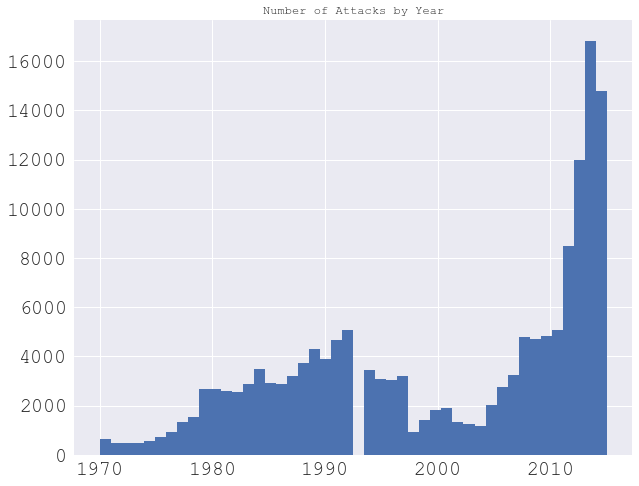

In [61]:
plt.hist(df.iyear,bins=46)
plt.title('Number of Attacks by Year')
plt.show()

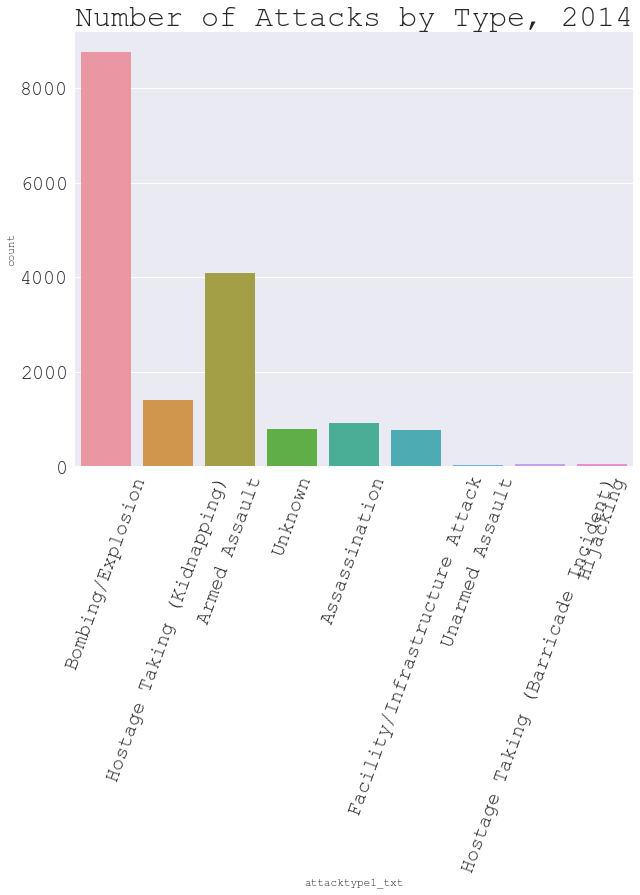

In [62]:
import seaborn as sns
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['font.size'] = 30
plt.rcParams['font.family'] = 'Courier New, monospace'
plt.rcParams['xtick.labelsize'] = 20 
plt.rcParams['ytick.labelsize'] = 20 
sns.countplot(x="attacktype1_txt", data=df[df.iyear==2014])
plt.title('Number of Attacks by Type, 2014',size=30)
plt.xticks(rotation=70)
plt.show()

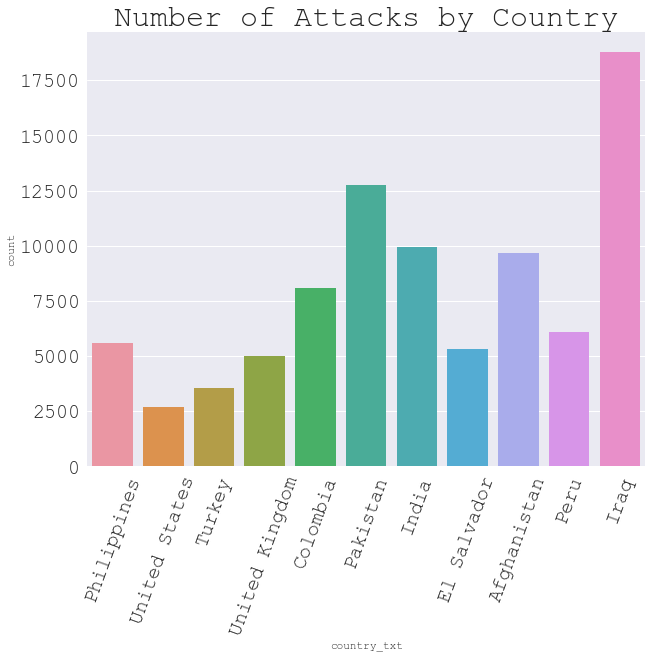

In [63]:
import seaborn as sns
# plt.rcParams['figure.figsize'] = (16, 14)
plt.rcParams['font.size'] = 30
plt.rcParams['font.family'] = 'Courier New, monospace'
plt.rcParams['xtick.labelsize'] = 20 
plt.rcParams['ytick.labelsize'] = 20 
countries = df.groupby(['country_txt']).attacktype1.count().reset_index().sort_values('attacktype1',ascending=False)[0:10]
countries = list(countries.country_txt)
countries.append('United States')
mask = df[df.country_txt.isin(countries)]
sns.countplot(x="country_txt", data=mask)
plt.title('Number of Attacks by Country',size=30)
plt.xticks(rotation=70)
plt.show()

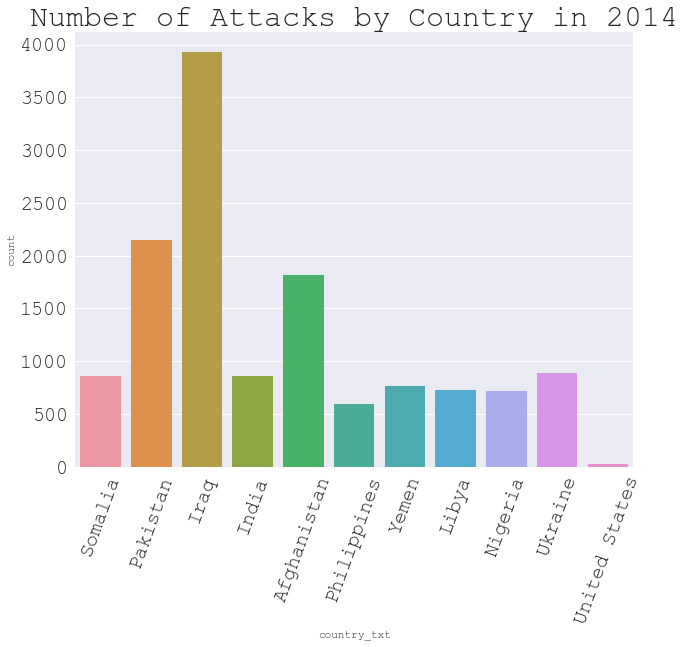

In [64]:
import seaborn as sns
# plt.rcParams['figure.figsize'] = (16, 14)
plt.rcParams['font.size'] = 30
plt.rcParams['font.family'] = 'Courier New, monospace'
plt.rcParams['xtick.labelsize'] = 20 
plt.rcParams['ytick.labelsize'] = 20 
countries = df[df.iyear==2014].groupby(['country_txt']).attacktype1.count().reset_index().sort_values('attacktype1',ascending=False)[0:10]
countries = list(countries.country_txt)
countries.append('United States')
mask = df[(df.country_txt.isin(countries))&(df.iyear==2014)]
sns.countplot(x="country_txt", data=mask)
plt.title('Number of Attacks by Country in 2014',size=30)
plt.xticks(rotation=70)
plt.show()

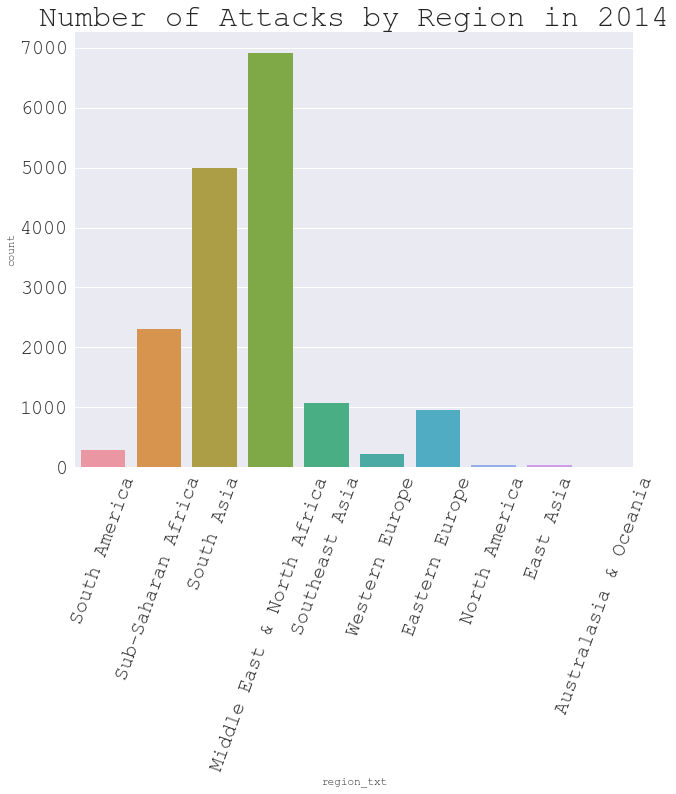

In [65]:
import seaborn as sns
# plt.rcParams['figure.figsize'] = (16, 14)
plt.rcParams['font.size'] = 30
plt.rcParams['font.family'] = 'Courier New, monospace'
plt.rcParams['xtick.labelsize'] = 20 
plt.rcParams['ytick.labelsize'] = 20 
regions = df[df.iyear==2014].groupby(['region_txt']).attacktype1.count().reset_index().sort_values('attacktype1',ascending=False)[0:10]
regions = list(regions.region_txt)
mask = df[(df.region_txt.isin(regions))&(df.iyear==2014)]
sns.countplot(x="region_txt", data=mask)
plt.title('Number of Attacks by Region in 2014',size=30)
plt.xticks(rotation=70)
plt.show()

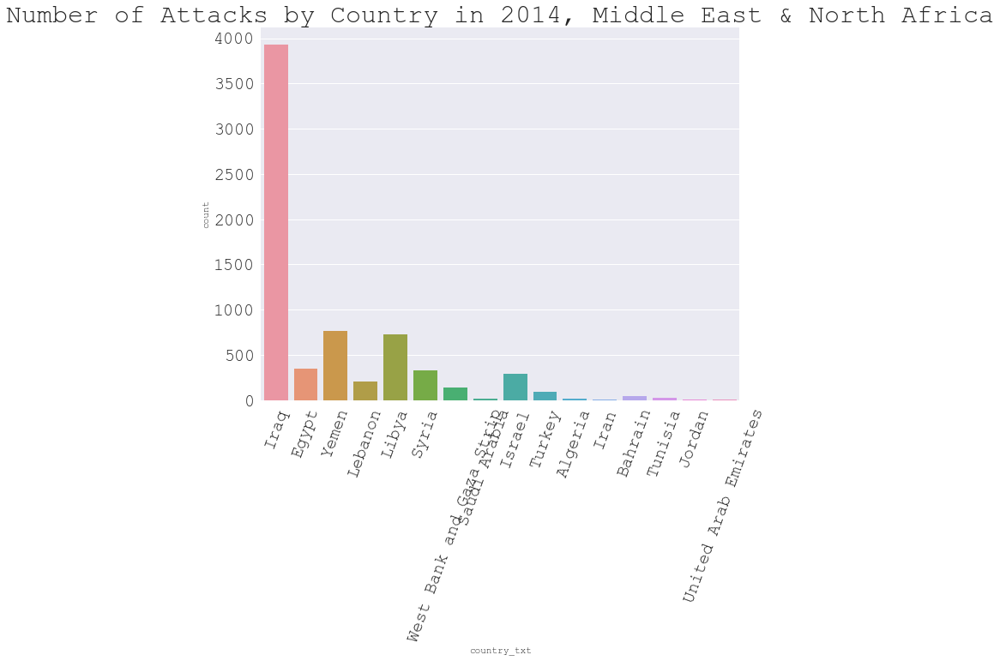

In [66]:
import seaborn as sns
# plt.rcParams['figure.figsize'] = (16, 14)
plt.rcParams['font.size'] = 30
plt.rcParams['font.family'] = 'Courier New, monospace'
plt.rcParams['xtick.labelsize'] = 20 
plt.rcParams['ytick.labelsize'] = 20 
mask = df[(df.region_txt=='Middle East & North Africa')&(df.iyear==2014)]
sns.countplot(x="country_txt", data=mask)
plt.title('Number of Attacks by Country in 2014, Middle East & North Africa',size=30)
plt.xticks(rotation=70)
plt.show()

In [121]:
# type(gnames.remove('Unknown'))
gnames[1:]

['Islamic State of Iraq and the Levant (ISIL)',
 'Taliban',
 'Al-Shabaab',
 'Boko Haram',
 "Donetsk People's Republic",
 "New People's Army (NPA)",
 'Al-Qaida in the Arabian Peninsula (AQAP)',
 'Maoists',
 'Tehrik-i-Taliban Pakistan (TTP)',
 'Revolutionary Armed Forces of Colombia (FARC)']

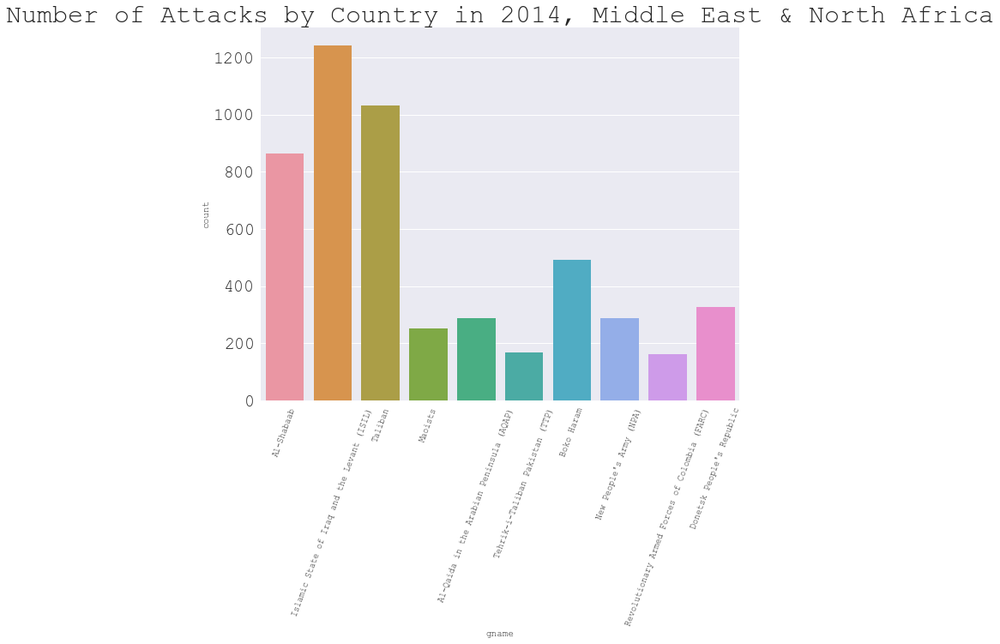

In [124]:
import seaborn as sns
# plt.rcParams['figure.figsize'] = (16, 14)
plt.rcParams['font.size'] = 30
plt.rcParams['font.family'] = 'Courier New, monospace'
plt.rcParams['xtick.labelsize'] = 10 
plt.rcParams['ytick.labelsize'] = 20 
gnames = df[df.iyear==2014].groupby(['gname']).attacktype1.count().reset_index().sort_values('attacktype1',ascending=False)[0:11]
gnames = list(gnames.gname)[1:]
mask = df[(df.gname.isin(gnames))&(df.iyear==2014)]
sns.countplot(x="gname", data=mask)
plt.title('Number of Attacks by Country in 2014, Middle East & North Africa',size=30)
plt.xticks(rotation=70)
plt.show()

In [144]:
pd.options.display.max_columns = 2000
pd.options.display.max_rows = 2000



,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,ingroup,ingroup2,ingroup3,gsubname3,motive,guncertain1,guncertain2,guncertain3,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
73051,200109110001,2001,9,11,NaN,0,NaN,34,Burundi,11,Sub-Saharan Africa,Mwaro,Gihange,-3.633892,29.709872,1,1,This incident occurred on a road near Gihange ...,##############################################...,1,1,1,0.0,NaN,.,0,1,0,2,Armed Assault,NaN,.,NaN,.,19,Transportation,99.0,Bus (excluding tourists),Civilians,Civilians on a minibus in western Burundi,34.0,Burundi,4.0,Military,29.0,Military Unit/Patrol/Convoy,Burundi Military,A Military Patrol near the town of Kivoga,34.0,Burundi,NaN,.,NaN,.,NaN,NaN,NaN,.,Unknown,NaN,NaN,NaN,NaN,-9,NaN,NaN,NaN,Unknown,0.0,NaN,NaN,NaN,0.0,0.0,NaN,.,NaN,NaN,.,NaN,NaN,.,NaN,5,Firearms,5.0,Unknown Gun Type,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,1.0,0.0,0.0,NaN,0.0,0.0,0,NaN,.,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,.,NaN,At least 10 army soldiers were killed by Front...,"""Burundi: Rebels Ambush Minibus North of Bujum...",NaN,NaN,CETIS,-9,-9,0,-9,NaN
73052,200109110002,2001,9,11,NaN,0,NaN,229,Congo,11,Sub-Saharan Africa,North Kivu,Muhanga,-1.049115,29.031531,1,0,NaN,##############################################...,1,1,1,0.0,NaN,.,0,1,0,2,Armed Assault,NaN,.,NaN,.,14,Private Citizens & Property,70.0,Student,Civilians,School children and civilians in Muhanga,229.0,Democratic Republic of the Congo,NaN,.,NaN,.,NaN,NaN,NaN,.,NaN,.,NaN,.,NaN,NaN,NaN,.,Unknown,NaN,NaN,NaN,NaN,-9,NaN,NaN,NaN,Unknown,0.0,NaN,NaN,NaN,0.0,0.0,NaN,.,NaN,NaN,.,NaN,NaN,.,NaN,5,Firearms,5.0,Unknown Gun Type,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,4.0,0.0,0.0,0.0,0.0,0.0,0,NaN,.,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,.,NaN,The soldiers arrived at the location of the at...,"""DRCongo: Four Killed in Shooting in Rebel Hel...",NaN,NaN,CETIS,-9,-9,0,-9,NaN
73053,200109110003,2001,9,11,NaN,0,NaN,97,Israel,10,Middle East & North Africa,Haifa,Magal,32.385553,35.036145,1,1,NaN,09/11/2001: Two border policemen were killed a...,1,1,1,0.0,NaN,.,0,1,0,2,Armed Assault,NaN,.,NaN,.,3,Police,22.0,"Police Building (headquarters, station, school)",Israeli Border Police,Border Police on a base between Kibbutz Magal ...,97.0,Israel,NaN,.,NaN,.,NaN,NaN,NaN,.,NaN,.,NaN,.,NaN,NaN,NaN,.,Unknown,NaN,NaN,NaN,NaN,-9,NaN,NaN,NaN,Unknown,0.0,NaN,NaN,NaN,0.0,0.0,NaN,.,NaN,NaN,.,NaN,NaN,.,NaN,5,Firearms,5.0,Unknown Gun Type,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,2.0,0.0,0.0,1.0,0.0,0.0,0,NaN,.,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,.,NaN,Israeli investigators believed the attack was ...,"""Two Border Policemen Killed, One Wounded in a...",NaN,NaN,CETIS,-9,-9,0,-9,NaN
73054,200109110

In [128]:

# POLITICAL, ECONOMIC, RELIGIOUS, OR SOCIAL GOAL (CRIT1)
# INTENTION TO COERCE, INTIMIDATE OR PUBLICIZE TO LARGER
# AUDIENCE(S) (CRIT2)
# OUTSIDE INTERNATIONAL HUMANITARIAN LAW (CRIT3)

feats = ['eventid','iyear','country_txt','region_txt','attacktype1_txt','attacktype2_txt','attacktype3_txt','crit1', 'crit2', 'crit3','success','suicide','weaptype1_txt','targtype1_txt','corp1','target1','natlty1_txt','gname','nperps','nkill','nwound','nhostkid','ransom']
df2 = df[feats]
# list(df.columns)

In [132]:
df2 = df2[df2.country_txt.isin(['Iraq','Pakistan'])]

In [141]:
df2[df2.gname.isin(['Tehrik-i-Taliban Pakistan (TTP)','Islamic State of Iraq and the Levant (ISIL)'])].attacktype1_txt.value_counts()

Bombing/Explosion                      2186
Armed Assault                           497
Hostage Taking (Kidnapping)             368
Unknown                                 257
Assassination                           174
Facility/Infrastructure Attack           60
Hostage Taking (Barricade Incident)      17
Hijacking                                 7
Unarmed Assault                           4
Name: attacktype1_txt, dtype: int64

In [188]:
df_before = df[df.region_txt=='Middle East & North Africa'][(df.iyear<2001)&(df.iyear>=1991)]
df_after = df[df.region_txt=='Middle East & North Africa'][(df.iyear>2001)&(df.iyear<=2011)]


/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app


In [266]:
types = pd.DataFrame(df_before[['attacktype1_txt','attacktype1','attacktype2','attacktype3']].groupby('attacktype1_txt').count()).reset_index()
types['num_before'] = types.attacktype1+types.attacktype2+types.attacktype3
types = types[['attacktype1_txt','num_before']]
types['pct_before'] = types.num_before / len(df_before)


types_temp = pd.DataFrame(df_after[['attacktype1_txt','attacktype1','attacktype2','attacktype3']].groupby('attacktype1_txt').count()).reset_index()
types['num_after'] =  types_temp.attacktype1+types_temp.attacktype2+types_temp.attacktype3
types['pct_after'] = types.num_after / len(df_after)

types['delta'] = types.pct_after - types.pct_before



types

,attacktype1_txt,num_before,pct_before,num_after,pct_after,delta
0,Armed Assault,1628,0.312836,2233,0.211099,-0.101738
1,Assassination,1112,0.213682,799,0.075534,-0.138148
2,Bombing/Explosion,1789,0.343774,7156,0.676498,0.332724
3,Facility/Infrastructure Attack,290,0.055726,126,0.011912,-0.043815
4,Hijacking,25,0.004804,9,0.000851,-0.003953
5,Hostage Taking (Barricade Incident),9,0.001729,9,0.000851,-0.000879
6,Hostage Taking (Kidnapping),154,0.029593,616,0.058234,0.028641
7,Unarmed Assault,64,0.012298,14,0.001324,-0.010975
8,Unknown,215,0.041314,119,0.011250,-0.030065


In [267]:
total_suicide_before = df_before.suicide[df_before.suicide==1].sum()
total_suicide_after = df_after.suicide[df_after.suicide==1].sum()

types['suicide_before'] = pd.DataFrame(df_before[['attacktype1_txt','suicide']].groupby('attacktype1_txt').suicide.sum()).reset_index()['suicide']
types['pct_suicide_before'] = types['suicide_before'] / total_suicide_before
types['suicide_after'] = pd.DataFrame(df_after[['attacktype1_txt','suicide']].groupby('attacktype1_txt').suicide.sum()).reset_index()['suicide']
types['pct_suicide_after'] = types['suicide_after'] / total_suicide_after

types






,attacktype1_txt,num_before,pct_before,num_after,pct_after,delta,suicide_before,pct_suicide_before,suicide_after,pct_suicide_after
0,Armed Assault,1628,0.312836,2233,0.211099,-0.101738,0,0.000000,3,0.002857
1,Assassination,1112,0.213682,799,0.075534,-0.138148,2,0.036364,40,0.038095
2,Bombing/Explosion,1789,0.343774,7156,0.676498,0.332724,51,0.927273,1005,0.957143
3,Facility/Infrastructure Attack,290,0.055726,126,0.011912,-0.043815,0,0.000000,0,0.000000
4,Hijacking,25,0.004804,9,0.000851,-0.003953,0,0.000000,1,0.000952
5,Hostage Taking (Barricade Incident),9,0.001729,9,0.000851,-0.000879,0,0.000000,1,0.000952
6,Hostage Taking (Kidnapping),154,0.029593,616,0.058234,0.028641,0,0.000000,0,0.000000
7,Unarmed Assault,64,0.012298,14,0.001324,-0.010975,0,0.000000,0,0.000000
8,Unknown,215,0.041314,119,0.011250,-0.030065,2,0.036364,0,0.000000


In [246]:
types

,attacktype1_txt,num_before,pct_before,num_after,pct_after,delta,suicide_before,pct_suicide_before,suicide_after,pct_suicide_after
0,Armed Assault,1582,0.303997,2087,0.197296,-0.106701,0,0.000000,3,0.002857
1,Assassination,1111,0.213490,782,0.073927,-0.139563,2,0.036364,40,0.038095
2,Bombing/Explosion,1763,0.338778,6976,0.659482,0.320704,51,0.927273,1005,0.957143
3,Facility/Infrastructure Attack,287,0.055150,112,0.010588,-0.044562,0,0.000000,0,0.000000
4,Hijacking,24,0.004612,8,0.000756,-0.003856,0,0.000000,1,0.000952
5,Hostage Taking (Barricade Incident),9,0.001729,8,0.000756,-0.000973,0,0.000000,1,0.000952
6,Hostage Taking (Kidnapping),149,0.028632,472,0.044621,0.015989,0,0.000000,0,0.000000
7,Unarmed Assault,64,0.012298,14,0.001324,-0.010975,0,0.000000,0,0.000000
8,Unknown,215,0.041314,119,0.011250,-0.030065,2,0.036364,0,0.000000


I'm going to compare the number of suicide bombings/explosions before and after 9/11. Although 9/11 is classified as 'Hijaking,' it involved suicide of the terrorists. I'm interested to see if the huge attack had any impact on the number of suicide bombings by comparing 10 years before 9/11 and 10 years after 9/11.

In [254]:
from __future__ import division

# Calcuate our prior-- before 9/11, the probability of a 
prior = len(df_before[df_before.suicide==1]) / len(df_before)
prior

0.010568793235972328

In [268]:
df_before

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,ingroup,ingroup2,ingroup3,gsubname3,motive,guncertain1,guncertain2,guncertain3,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,Date
41260,199001300001,1991,1,30,NaN,0,NaN,102,Jordan,10,Middle East & North Africa,Amman,Amman,31.950001,35.933331,1,0,NaN,NaN,1,1,1,-9.0,NaN,.,0,1,0,7,Facility/Infrastructure Attack,NaN,.,NaN,.,7,Government (Diplomatic),46.0,Embassy/Consulate,French State Dept,French Cultural Center,69.0,France,NaN,.,NaN,.,NaN,NaN,NaN,.,NaN,.,NaN,.,NaN,NaN,NaN,.,Unknown,NaN,NaN,NaN,NaN,-9,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,.,NaN,NaN,.,NaN,NaN,.,NaN,8,Incendiary,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,Incendiary,0.0,NaN,NaN,0.0,NaN,NaN,1,NaN,.,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,.,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,NaN
45017,199101100016,1991,1,10,NaN,0,NaN,97,Israel,10,Middle East & North Africa,Jerusalem,Jerusalem,31.766496,35.211720,1,0,NaN,NaN,1,1,1,-9.0,NaN,.,0,1,0,7,Facility/Infrastructure Attack,NaN,.,NaN,.,7,Government (Diplomatic),45.0,"Diplomatic Personnel (outside of embassy, cons...",U.S. State Department,U.S. Diplomat's Vehicle,217.0,United States,NaN,.,NaN,.,NaN,NaN,NaN,.,NaN,.,NaN,.,NaN,NaN,NaN,.,Palestinians,NaN,NaN,NaN,NaN,534,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,.,NaN,NaN,.,NaN,NaN,.,NaN,8,Incendiary,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,Incendiary,0.0,NaN,NaN,0.0,NaN,NaN,1,3.0,Minor (likely < $1 million),20000.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,.,NaN,NaN,NaN,NaN,NaN,PGIS,1,1,1,1,NaN,NaN
45031,199101110004,1991,1,11,NaN,0,NaN,209,Turkey,10,Middle East & North Africa,Istanbul,Istanbul,41.013517,28.950672,1,0,NaN,NaN,1,1,1,-9.0,NaN,.,0,1,0,1,Assassination,NaN,.,NaN,.,3,Police,25.0,Police Security Forces/Officers,Police,Former Policeman Habib Gur,209.0,Turkey,NaN,.,NaN,.,NaN,NaN,NaN,.,NaN,.,NaN,.,NaN,NaN,NaN,.,Unknown,NaN,NaN,NaN,NaN,-9,NaN,NaN,NaN,NaN,0.0,NaN,NaN,2.0,NaN,NaN,NaN,.,NaN,NaN,.,NaN,NaN,.,NaN,5,Firearms,3.0,Handgun,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,Pistol,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,.,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,.,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,0,-9,NaN,NaN
45057,199101140003,1991,1,14,NaN,0,NaN,209,Turkey,10,Middle East & North Africa,Adana,Adana,36.991540,35.331051,1,0,NaN,NaN,1,0,1,1.0,3.0,Intra/Inter-group Conflict,0,1,0,3,Bombing/Explosion,NaN,.,NaN,.,22,Violent Political Party,110.0,Party Office/Facility,Motherland Party (ANAVATAN),District Branch,209.0,Turkey,NaN,.,NaN,.,NaN,NaN,NaN,.,NaN,.,NaN,.,NaN,NaN,NaN,.,Unknown,NaN,NaN,NaN,NaN,-9,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,.,NaN,NaN,.,NaN,NaN,.,NaN,6,Explosives/Bombs/Dynamite,16.0,Unknown Explosive Type,NaN,.,NaN,.,NaN,.,NaN,.,NaN,.,Na

In [ ]:
# Assuming normality, construct the confidence interval
from scipy.stats import t
import numpy as np
from math import sqrt
import scipy.stats as stats

# Create a random vector of 30 numbers from the normal distribution

Data_vec = stats.norm.rvs(size = 30)

# Compute the mean of this vector

Mean_for_data =  np.average(Data_vec)

# Compute the standard deviation (or variance and take the sqrt of that)

SDev_for_data = np.std(Data_vec, ddof=1)

# Compute the classical confidence interval
Confidence_for_data = [Mean_for_data + val * SDev_for_data / sqrt(len(Data_vec)) for val in t.interval(0.95, len(Data_vec) - 1)]

# Compute with Bayes
stats.bayes_mvs(Data_vec, alpha=0.95)

In [20]:
bombings = df[['iyear','country_txt','latitude','longitude','attacktype1_txt']][df.attacktype1_txt=='Bombing/Explosion']
bombings = bombings.groupby(['iyear','country_txt','latitude','longitude']).attacktype1_txt.count().reset_index()

In [ ]:
bombings = bombings.merge(world[['name','geometry','iso_a3','pop_est']],how='left', left_on='country_txt', right_on='name').drop('name',axis=1)

In [ ]:
bombings.dropna(inplace=True)
type(bombings)

In [ ]:
import os
import pandas as pd
import numpy as np
from random import randint, uniform
from datetime import datetime
from urllib import urlretrieve
from zipfile import ZipFile
import pysal

# geo stuff
import geopandas as gpd
from shapely.geometry import Point
# from ipyleaflet import (Map,
#     Marker,
#     TileLayer, ImageOverlay,
#     Polyline, Polygon, Rectangle, Circle, CircleMarker,
#     GeoJSON,
#     DrawControl
# )

# plotting stuff
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('bmh')
plt.rcParams['figure.figsize'] = (20.0, 20.0)

# widget stuff
from ipywidgets import interact, HTML, FloatSlider
from IPython.display import clear_output, display

# progress stuff
from tqdm import tqdm_notebook, tqdm_pandas

# turn warnings off
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import pysal
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
terror = pd.read_csv('/Users/jennydoyle/Desktop/dsi/04-project-assets/globalterrorismdb_0616dist.csv')


fix_names = {'Dem. Rep. Korea':'South Korea',
'Korea':'North Korea',
'Czech Rep.':'Czech Republic',
'Bosnia and Herz.':'Bosnia-Herzegovina',
'Bosnia and Herzegovina':'Bosnia-Herzegovina',
'Central African Rep.': 'Central African Republic',
 'Dem. Rep. Congo':  'Congo',
'Lao PDR':'Laos',
'Slovakia':'Slovak Republic'}

world.name.replace(fix_names, inplace=True)

fix_countries = {'Democratic Republic of the Congo':'Congo',
"People's Republic of the Congo"  :'Congo',
'Republic of the Congo':'Congo',
'Dominica':'Dominican Rep.',
'Dominican Republic':'Dominican Rep.',
'Czechoslovakia': 'Czech Republic',
'East Germany (GDR)':'Germany',
'East Timor':'Timor-Leste', 
'Equatorial Guinea':'Eq. Guinea',                
'Falkland Islands':'Falkland Is.',
'Hong Kong':'China',
'North Yemen':'Yemen',
'Serbia-Montenegro':'Serbia',
'Solomon Islands':'Solomon Is.',
'South Sudan':'Sudan',
'South Vietnam':'Vietnam',
'South Yemen':'Yemen',
'Soviet Union':'Russia',
'West Germany (FRG)':'Germany',                 
'Western Sahara':'W. Sahara'}

terror.country_txt.replace(fix_countries, inplace=True)


terror_grouped = terror.groupby('country_txt').count().reset_index()
terror_grouped = terror_grouped[['country_txt','eventid']]
terror_grouped.rename(columns={'eventid':'Num_Tattacks'},inplace=True)

world_terror = world.merge(terror_grouped, left_on='name', right_on='country_txt')

q10 = pysal.Quantiles(world_terror.Num_Tattacks,k=10)
f, ax = plt.subplots(1, figsize=(20,10))
world_terror.assign(cl=q10.yb).plot(column='Num_Tattacks', categorical=True, cmap='OrRd', linewidth=0.1, ax=ax, k=10, scheme='QUANTILES')
ax.set_axis_off()
plt.show()

# http://darribas.org/gds_scipy16/ipynb_md/02_geovisualization.html

In [ ]:
def make_plot(year=1970):

    # filter dataframe
    temp = world_terror[world_terror['iyear']==year]
    
    q10 = pysal.Quantiles(temp.Num_Tattacks,k=10)
    f, ax = plt.subplots(1, figsize=(20,10))
    temp.assign(cl=q10.yb).plot(column='Num_Tattacks', categorical=True, cmap='OrRd', linewidth=0.1, ax=ax, k=10, scheme='QUANTILES')
    ax.set_axis_off()
    plt.show()

In [ ]:
terror_grouped = terror[terror.attacktype1_txt=='Bombing/Explosion'].groupby(['country_txt','iyear']).count().reset_index()
terror_grouped = terror_grouped[['country_txt','iyear','eventid']]
terror_grouped.rename(columns={'eventid':'Num_Tattacks'},inplace=True)

world_terror = world.merge(terror_grouped, left_on='name', right_on='country_txt')



# http://darribas.org/gds_scipy16/ipynb_md/02_geovisualization.html





# create widget
interact(make_plot, year=(1970, 2015, 1))




In [ ]:
terror.iyear.max()

# II. Bayseian Inference

- Construct a prior about the amount of terror a given area has seen
- Update that prior with new information (like a new year of attacks or a contrasting country from within the same region).

- Compare two populations of your choosing using Bayesian inference. We want to know if the amount of terror one area has seen differs in a significant way than another area (or time period!)

For example, if you are interested in knowing if one country in South America differs in a significant way from another area, you may:

- make your prior assume that some country is a country in South America with μ average attacks and σ variation across South American countries
- update that prior with the information of a single country in South America as well as a separate country in South America
- How significantly do the resulting posteriors differ? (An important assumption made here is that the time periods are being held constant, perhaps a single year.)

- Structure your own test of populations rather than using the above example. If you're unable to setup a different test, brainstorm with your squad in the Slack chat.

- Justify the prior you selected and interpret your results (use credible intervals.) 
- Remember you can attempt to use different priors (but don't "prior hack" to affect your output!)

In [ ]:
import math
import scipy.integrate as integrate
from scipy.stats import beta

# UN comment to get the error 
#1/my_beta(141, 263)
def func1(x):
    return (x)**263*(1-x)**141

def log_beta(a,b):
    beta_num = math.exp(math.lgamma(a) + math.lgamma(b) - math.lgamma(a+b))
    return beta_num

log_beta(141,263)*integrate.quad(lambda x: func1(x) ,0, .65)[0]

We see that the $P(\theta \le .65)$ is very close to 0, and therefore we believe the poll did not provide "good" information with respect to the actual electoral results

Iraq and Pakistan, 2014